In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import os
import csv
import numpy as np



In [2]:
def get_hand_moving(path):
    df = pd.read_csv(path,sep = '\t')   
    all_distances= []
    for row in range(1,len(df)):
        distance = ((df.iloc[row-1]["accel_x"]-df.iloc[row]["accel_x"])**2 + (df.iloc[row-1]["accel_y"]-df.iloc[row]["accel_y"])**2 +(df.iloc[row-1]["accel_z"]-df.iloc[row]["accel_z"])**2)**0.5
        all_distances.append(distance)
    return all_distances

def get_stats(check_list):
    standard = np.std(check_list)
    mean = np.mean(check_list)
    return [min(check_list),mean-standard-standard,mean-standard,mean,mean + standard,mean +standard+standard ,max(check_list) ]

def get_index_over(check_list, high_limit):
    indexes_over = [i for i,v in enumerate(check_list) if v > high_limit]
    return indexes_over

def show_high_hits(path,data_type,bounds):
    
    plt.subplot(bounds[0],bounds[1],bounds[2])
    df = pd.read_csv(path,sep = '\t')   
    plt.xlabel("Time(seconds)")
    plt.ylabel(data_type)
    plt.scatter(df["t"],df[data_type])

    movement_list= get_hand_moving(path)
    for i in get_index_over(movement_list, get_stats(movement_list)[4] ):
        plt.plot(i*0.002,df.iloc[i][data_type],'ro', markersize=5) 

    name = path.split("/")[-1]

    plt.title(f"{name} on {data_type} ")



In [3]:
#doesn't really work, displays all charts in 1 graph 
def non_working(f_path, data_type,grid_dims ):
    full_path =f_path +"/"
    #"/Users/cslinxs/Desktop/week1/aurorabp-sample-data/sample/measurements_auscultatory/a000/"
    #plt.rcParams["figure.figsize"] = (10,16)
    plt.figure(figsize=(100, 100)) 
    count =1
    for files in os.listdir(f_path):
        #print(files)
        
        show_high_hits(full_path+files, data_type,grid_dims)
        count+=1

In [4]:
# for the pressure
plt.rcParams['font.family'] = 'sans-serif'
plt.rcParams.update({'font.size': 40})
full_path = "/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/measurements_auscultatory/a000/"
#plt.rcParams["figure.figsize"] = (10,16)
plt.figure(figsize=(100, 100)) 
count =1
for files in os.listdir("/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/measurements_auscultatory/a000"):
    #print(files)
    
    show_high_hits(full_path+files, "pressure",[7,2,count])
    count+=1

In [5]:
# for ppg optical
full_path = "/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/measurements_auscultatory/a000/"
plt.figure(figsize=(100, 100)) 
count =1
for files in os.listdir("/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/measurements_auscultatory/a000"):
    #print(files)
    
    show_high_hits(full_path+files, "optical",[7,2,count])
    count+=1

In [6]:
# for ekg
full_path = "/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/measurements_auscultatory/a000/"
plt.figure(figsize=(100, 100)) 
count =1
for files in os.listdir("/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/measurements_auscultatory/a000"):
    
    show_high_hits(full_path+files, "ekg",[7,2,count])
    count+=1

In [7]:
# for ppg optical
full_path = "/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/measurements_auscultatory/a000/"
plt.figure(figsize=(100, 100)) 
count =1
for files in os.listdir("/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/measurements_auscultatory/a000"):
    #print(files)
    
    show_high_hits(full_path+files, "optical",[7,2,count])
    count+=1

In [8]:
def get_pulse_pressure(path, person_number):
    df = pd.read_csv(path,sep = '\t') 
    df
    person0 = df.loc[df['pid'] == 'a00'+str(person_number)]

    person0 
    sbp_data = dict(zip(person0["measurement"], list(zip(person0["sbp"], person0["consensus_systolic_error"]))))
    dbp_data = dict(zip(person0["measurement"], list(zip(person0["dbp"], person0["consensus_diastolic_error"]))))


    plt.rcParams.update({'font.size': 10})


    activeies = list(sbp_data.keys())
    sbp_values = [ items[0] for items in list(sbp_data.values()) ] 
    sbp_error = [ items[1] for items in list(sbp_data.values()) ] 
    dbp_values = [ items[0] for items in list(dbp_data.values()) ] 
    dbp_error = [ items[1] for items in list(dbp_data.values()) ] 



    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.bar(activeies, height=sbp_values, width=0.35,  align='center', yerr=sbp_error, color = "pink", label="SBP")

    ax.bar(activeies, height=dbp_values, width=0.35/2,align='center', yerr=dbp_error , color= "red", label="DBP")
    plt.errorbar(activeies, dbp_values, yerr=dbp_error, capsize=4, ecolor='black', fmt=' ', elinewidth=1,)

    plt.errorbar(activeies, sbp_values, yerr=sbp_error, capsize=4, ecolor='black', fmt=' ', elinewidth=1,)

    ax.set_xticks(activeies)
    num_values = np.arange(len(dbp_values))

    plt.legend(loc="upper left")

    ax.axhline(130, color="black", linewidth = 2)
    ax.axhline(90, color="gray", linewidth = 2)

    plt.tick_params(rotation=90)

    participant_data = "/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/participants.tsv"
    participant_data_df = pd.read_csv(participant_data,sep = '\t') 

    person_name = participant_data_df[participant_data_df['pid'] == "a00"+str(person_number)]

    person_name =  person_name.iloc[0]["self_report_htn"]
    plt.title(f"aa00{person_number} pulse pressure pre: {person_name}")
    #plt.figure(figsize=(100, 100)) 
    plt.tight_layout()
    plt.show()

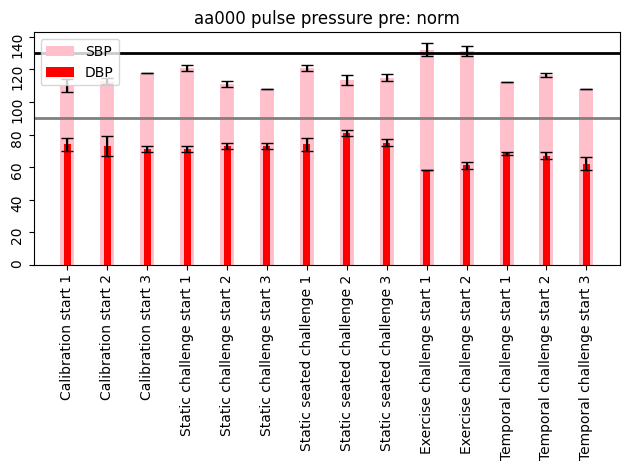

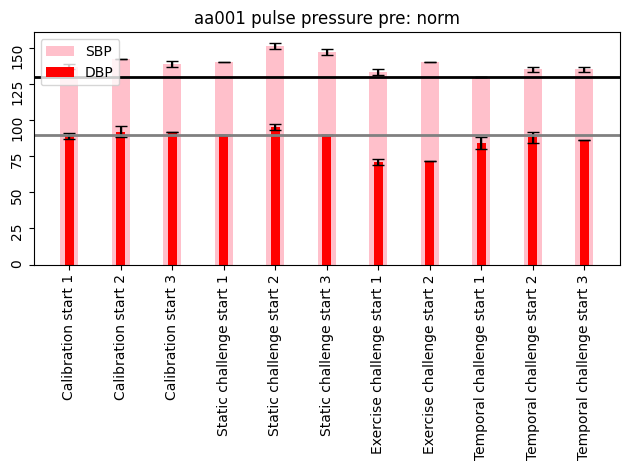

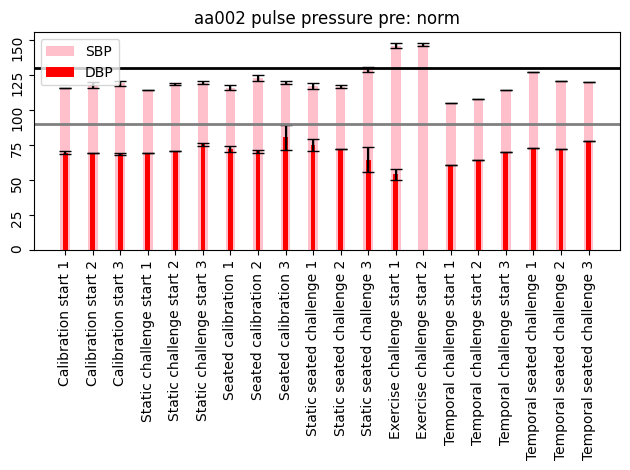

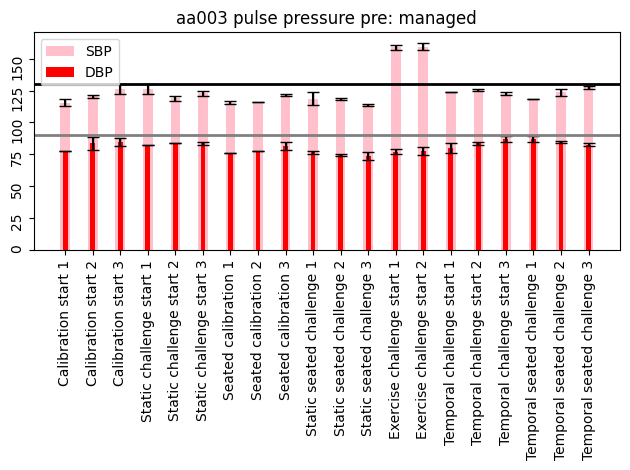

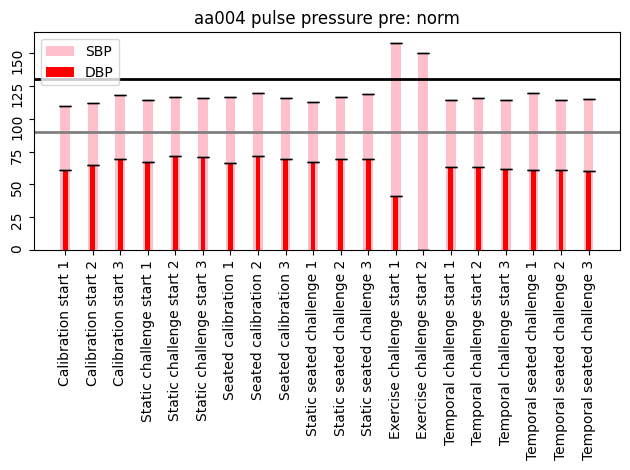

In [9]:
my_path = "/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/measurements_auscultatory.tsv"

for i in range(5):
    get_pulse_pressure(my_path,i)

In [10]:
participant_data_file = "/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/participants.tsv"
participant_data = pd.read_csv(participant_data_file,sep = '\t') 
participant_data

,pid,n_meas_inlab,n_meas_ambulatory,aurora_size,fitzpatrick_scale,bp_cuff_arm,in_feature_table,age,height,weight,...,coronary_artery_disease,diabetes,arrythmia,previous_heart_attack,previous_stroke,heart_failure,aortic_stenosis,valvular_heart_disease,other_cv_diseases,cvd_meds
0,o000,15,41.0,L,NaN,R,1,33.0,68.0,200.0,...,0,0,0,0,0,0,0,0,0,0
1,o001,15,43.0,M,4.0,L,1,52.0,72.0,171.0,...,0,0,0,0,0,0,0,0,0,0
2,o002,0,47.0,M,NaN,R,0,46.0,62.0,190.0,...,0,1,0,0,0,0,0,0,1,1
3,o003,14,46.0,S,2.0,R,1,43.0,63.0,170.0,...,0,0,0,0,0,0,0,0,0,1
4,o004,14,39.0,S,NaN,R,1,49.0,66.0,154.0,...,0,0,0,0,0,0,0,0,1,1
5,o005,14,40.0,M,NaN,R,1,30.0,71.0,160.0,...,0,0,0,0,0,0,0,0,0,0
6,a000,14,NaN,S,2.0,L,1,56.0,63.0,108.0,...,0,0,0,0,0,0,0,0,0,0
7,a001,11,NaN,S,1.0,L,1,51.0,66.0,125.0,...,0,0,0,0,0,0,0,0,0,0
8,a002,19,NaN,L,2.0,L,1,33.0,74.0,230.0,...,0,0,0,0,0,0,0,0,0,0
9,a003,20,NaN,L,1.0,R,0,78.0,68.0,260.0,...,0,0,1,0,0,0,0,0,0,1


Now to compare particiant stats to 
their 
aurora_size
These are my classfications based off of sbp >130 or dbp>90


In [11]:
def compare_aurora_hypertension():
    auscultatory_data = "/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/measurements_auscultatory.tsv"
    hr_date = pd.read_csv(auscultatory_data,sep = '\t') 
    sbp_over = pd.concat([hr_date.loc[hr_date['sbp']+ hr_date['consensus_systolic_error'] >= 130] , hr_date.loc[hr_date['dbp']+ hr_date['consensus_diastolic_error'] >= 90] ] ).drop_duplicates().reset_index(drop=True)
    # https://stackoverflow.com/questions/21317384/how-to-concatenate-two-dataframes-without-duplicates

    # https://stackoverflow.com/questions/30791265/how-to-filter-a-pandas-dataframe-by-cells-that-do-not-contain-a-substring
    sbp_over = list(set(sbp_over[~sbp_over['measurement'].str.contains('Exercise')]["pid"]))


    participant_data_file = "/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/participants.tsv"
    participant_data = pd.read_csv(participant_data_file,sep = '\t') 


    people_tested = participant_data[participant_data['pid'].str.contains('a00')]
    people_tested_positive = people_tested[people_tested['pid'].isin(sbp_over)]


    aurora_sizes = ["S", "M","L"]

    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.bar(aurora_sizes, height=[
    int(people_tested['aurora_size'].value_counts()["S"]),
    int(people_tested['aurora_size'].value_counts()["M"]),
    int(people_tested['aurora_size'].value_counts()["L"])
    ], width=0.35,  align='center',  color = "blue", label="Total group")

    ax.bar(aurora_sizes, height=[
    int(people_tested_positive['aurora_size'].value_counts().get('S', 0)),
    int(people_tested_positive['aurora_size'].value_counts().get('M', 0)),
    int(people_tested_positive['aurora_size'].value_counts().get('L', 0))

    ], width=0.35/2,align='center', color= "lightblue", label="Have hypertension")


    ax.set_xticks(aurora_sizes)
    num_values = np.arange(len(aurora_sizes))

    plt.legend(loc="upper left")


    plt.title(f"Aurora size to hypertension on {len(people_tested)} people")
    plt.figure(figsize=(100, 100)) 
    plt.tight_layout()
    plt.show()

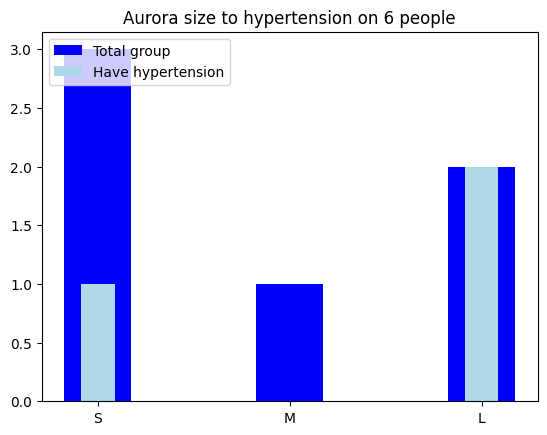

<Figure size 10000x10000 with 0 Axes>

In [12]:
compare_aurora_hypertension()

In [13]:
def compare_aurora_hypertension(auscultatory_data,participant_data,  ):
    auscultatory_data = "/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/measurements_auscultatory.tsv"
    hr_date = pd.read_csv(auscultatory_data,sep = '\t') 
    sbp_over = pd.concat([hr_date.loc[hr_date['sbp']+ hr_date['consensus_systolic_error'] >= 130] , hr_date.loc[hr_date['dbp']+ hr_date['consensus_diastolic_error'] >= 90] ] ).drop_duplicates().reset_index(drop=True)

    sbp_over = list(set(sbp_over[~sbp_over['measurement'].str.contains('Exercise')]["pid"]))


    participant_data_file = "/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/participants.tsv"
    participant_data = pd.read_csv(participant_data_file,sep = '\t') 


    people_tested = participant_data[participant_data['pid'].str.contains('a00')]
    people_tested_positive = people_tested[people_tested['pid'].isin(sbp_over)]


    aurora_sizes = ["S", "M","L"]

    fig = plt.figure()
    ax = fig.add_subplot(111)
    ax.bar(aurora_sizes, height=[
    int(people_tested['aurora_size'].value_counts()["S"]),
    int(people_tested['aurora_size'].value_counts()["M"]),
    int(people_tested['aurora_size'].value_counts()["L"])
    ], width=0.35,  align='center',  color = "green", label="Total group")

    ax.bar(aurora_sizes, height=[
    int(people_tested_positive['aurora_size'].value_counts().get('S', 0)),
    int(people_tested_positive['aurora_size'].value_counts().get('M', 0)),
    int(people_tested_positive['aurora_size'].value_counts().get('L', 0))

    ], width=0.35/2,align='center', color= "blue", label="Have hypertension")


    ax.set_xticks(aurora_sizes)
    num_values = np.arange(len(aurora_sizes))

    plt.legend(loc="upper left")


    plt.tick_params(rotation=90)
    plt.title(f"Aurora size to hypertension on {len(people_tested)} people")
    plt.figure(figsize=(100, 100)) 
    plt.tight_layout()
    plt.show()

In [14]:
participant_data_file = "/Users/cslinxs/Desktop/all_weeks/aurorabp-sample-data/sample/participants.tsv"
participant_data = pd.read_csv(participant_data_file,sep = '\t') 
participant_data

,pid,n_meas_inlab,n_meas_ambulatory,aurora_size,fitzpatrick_scale,bp_cuff_arm,in_feature_table,age,height,weight,...,coronary_artery_disease,diabetes,arrythmia,previous_heart_attack,previous_stroke,heart_failure,aortic_stenosis,valvular_heart_disease,other_cv_diseases,cvd_meds
0,o000,15,41.0,L,NaN,R,1,33.0,68.0,200.0,...,0,0,0,0,0,0,0,0,0,0
1,o001,15,43.0,M,4.0,L,1,52.0,72.0,171.0,...,0,0,0,0,0,0,0,0,0,0
2,o002,0,47.0,M,NaN,R,0,46.0,62.0,190.0,...,0,1,0,0,0,0,0,0,1,1
3,o003,14,46.0,S,2.0,R,1,43.0,63.0,170.0,...,0,0,0,0,0,0,0,0,0,1
4,o004,14,39.0,S,NaN,R,1,49.0,66.0,154.0,...,0,0,0,0,0,0,0,0,1,1
5,o005,14,40.0,M,NaN,R,1,30.0,71.0,160.0,...,0,0,0,0,0,0,0,0,0,0
6,a000,14,NaN,S,2.0,L,1,56.0,63.0,108.0,...,0,0,0,0,0,0,0,0,0,0
7,a001,11,NaN,S,1.0,L,1,51.0,66.0,125.0,...,0,0,0,0,0,0,0,0,0,0
8,a002,19,NaN,L,2.0,L,1,33.0,74.0,230.0,...,0,0,0,0,0,0,0,0,0,0
9,a003,20,NaN,L,1.0,R,0,78.0,68.0,260.0,...,0,0,1,0,0,0,0,0,0,1
